<a href="https://colab.research.google.com/github/turna1/Gemini_2.0_Flash/blob/main/gemini2_0_spatial_starter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Spatial Understanding with Gemini 2.0  Tutorial

In this tutorial I tried to showcase some use-cases following the official Github repo of Gemini 2.0. The use-case includes:
1. Image detection with bounding box with generative labelling
2. Spatial reasoning
3. Multilingual spatial understanding
4. Specific Search

Gemini 2.0 has brought several capabilities under one model. Let's explore the mindblowing features
contributor: Rahatara Ferdousi

**Install SDK**



In [ ]:
!pip install -U -q google-genai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.5/111.5 kB 8.1 MB/s eta 0:00:00


### Set up your API key

To run the following cell, your API key must be stored in a Colab Secret named `GOOGLE_API_KEY`.

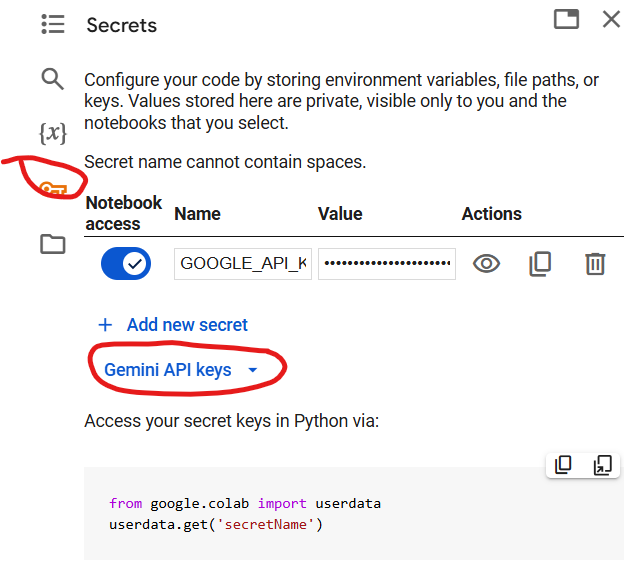


 If you don't already have an API key, or you're not sure how to create a Colab Secret, see [Authentication](../quickstarts/Authentication.ipynb) for an example.

In [ ]:
from google.colab import userdata
import os

os.environ['GOOGLE_API_KEY'] = userdata.get('GOOGLE_API_KEY')


In [ ]:
from google import genai
from google.genai import types
client = genai.Client(api_key=os.environ['GOOGLE_API_KEY'])

In [ ]:
model_name = "gemini-2.0-flash-exp" # @param ["gemini-1.5-flash-001","gemini-1.5-pro-002","gemini-2.0-flash-exp"] {"allow-input":true}


**Download Example Inmages**
1. Download the image examples used in this turoial from [here](https://drive.google.com/drive/folders/1L3IMurHnjJYQFSvXikTy7b5BYMR4NK5U?usp=sharing)
2. Upload to your colab environment

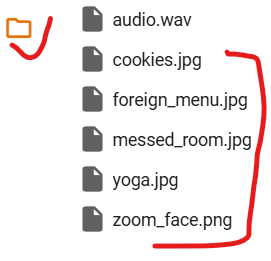

In [ ]:
# @title Install more
import google.generativeai as genai
from PIL import Image

import io
import os
import requests
from io import BytesIO
import types


**Define System Instruction to Create Bounding Box**

In [ ]:
bounding_box_system_instructions = """
    Return bounding boxes as a JSON array with labels. Never return masks or code fencing. Limit to 25 objects.
    If an object is present multiple times, name them according to their unique characteristic (colors, size, position, unique characteristics, etc..).
      """

**Fuction to Plot Bounding Box**

In [ ]:
# Get Noto JP font to display janapese characters
!apt-get install fonts-noto-cjk  # For Noto Sans CJK JP

#!apt-get install fonts-source-han-sans-jp # For Source Han Sans (Japanese)

import json
import random
import io
from PIL import Image, ImageDraw, ImageFont
from PIL import ImageColor

additional_colors = [colorname for (colorname, colorcode) in ImageColor.colormap.items()]

def plot_bounding_boxes(im, bounding_boxes):
    """
    Plots bounding boxes on an image with markers for each a name, using PIL, normalized coordinates, and different colors.

    Args:
        img_path: The path to the image file.
        bounding_boxes: A list of bounding boxes containing the name of the object
         and their positions in normalized [y1 x1 y2 x2] format.
    """

    # Load the image
    img = im
    width, height = img.size
    print(img.size)
    # Create a drawing object
    draw = ImageDraw.Draw(img)

    # Define a list of colors
    colors = [
    'red',
    'green',
    'blue',
    'yellow',
    'orange',
    'pink',
    'purple',
    'brown',
    'gray',
    'beige',
    'turquoise',
    'cyan',
    'magenta',
    'lime',
    'navy',
    'maroon',
    'teal',
    'olive',
    'coral',
    'lavender',
    'violet',
    'gold',
    'silver',
    ] + additional_colors

    # We parse out the markdown fencing
    bounding_boxes = parse_json(bounding_boxes)

    font = ImageFont.truetype("NotoSansCJK-Regular.ttc", size=14)

    # Iterate over the bounding boxes
    for i, bounding_box in enumerate(json.loads(bounding_boxes)):
      # Select a color from the list
      color = colors[i % len(colors)]

      # Convert normalized coordinates to absolute coordinates
      abs_y1 = int(bounding_box["box_2d"][0]/1000 * height)
      abs_x1 = int(bounding_box["box_2d"][1]/1000 * width)
      abs_y2 = int(bounding_box["box_2d"][2]/1000 * height)
      abs_x2 = int(bounding_box["box_2d"][3]/1000 * width)

      if abs_x1 > abs_x2:
        abs_x1, abs_x2 = abs_x2, abs_x1

      if abs_y1 > abs_y2:
        abs_y1, abs_y2 = abs_y2, abs_y1

      # Draw the bounding box
      draw.rectangle(
          ((abs_x1, abs_y1), (abs_x2, abs_y2)), outline=color, width=4
      )

      # Draw the text
      if "label" in bounding_box:
        draw.text((abs_x1 + 8, abs_y1 + 6), bounding_box["label"], fill=color, font=font)

    # Display the image
    img.show()


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Suggested packages:
  fonts-noto-cjk-extra
The following NEW packages will be installed:
  fonts-noto-cjk
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 61.2 MB of archives.
After this operation, 93.2 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 fonts-noto-cjk all 1:20220127+repack1-1 [61.2 MB]
Fetched 61.2 MB in 1s (71.4 MB/s)
Selecting previously unselected package fonts-noto-cjk.
(Reading database ... 123633 files and directories currently installed.)
Preparing to unpack .../fonts-noto-cjk_1%3a20220127+repack1-1_all.deb ...
Unpacking fonts-noto-cjk (1:20220127+repack1-1) ...
Setting up fonts-noto-cjk (1:20220127+repack1-1) ...
Processing triggers for fontconfig (2.13.1-4.2ubuntu5) ...


**Function to parse Json output**

In [ ]:
def parse_json(json_output):
    # We parse out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output


**Use Case: Labelling Cookies**

Let's see if Gemini 2.0 can identify and define various cookies with a bounding box.

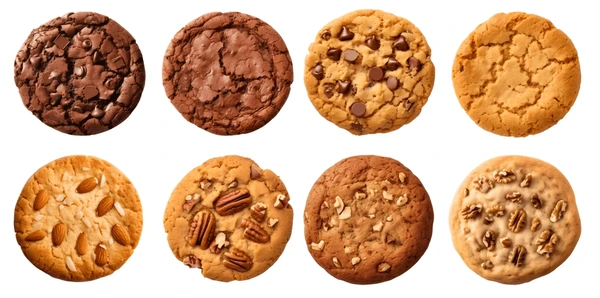

In [ ]:

image = "/content/cookies.jpg" # @param ["Socks.jpg","Vegetables.jpg","Japanese_bento.png","Cupcakes.jpg","Origamis.jpg","Fruits.jpg","Cat.jpg","Pumpkins.jpg","Breakfast.jpg","Bookshelf.jpg", "Spill.jpg"] {"allow-input":true}

im = Image.open(image)
im

In [ ]:
safety_settings = [
    types.SafetySetting(
        category="HARM_CATEGORY_DANGEROUS_CONTENT",
        threshold="BLOCK_ONLY_HIGH",
    ),
]

In [ ]:
prompt = "Detect the 2d bounding boxes for each  of the cookies (with “label” as topping description”)"  # @param {type:"string"}

# Load and resize image
img = Image.open(BytesIO(open(image, "rb").read()))
im = Image.open(image).resize((1024, int(1024 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS)

# Run model to find bounding boxes
response = client.models.generate_content(
    model=model_name,
    contents=[prompt, im],
    config = types.GenerateContentConfig(
        system_instruction=bounding_box_system_instructions,
        temperature=0.5,
        safety_settings=safety_settings,
    )
)

# Check output
print(response.text)

**Visualize the output.**
👌 No training, no labelling and just see the output. Unbelievable

(1024, 508)


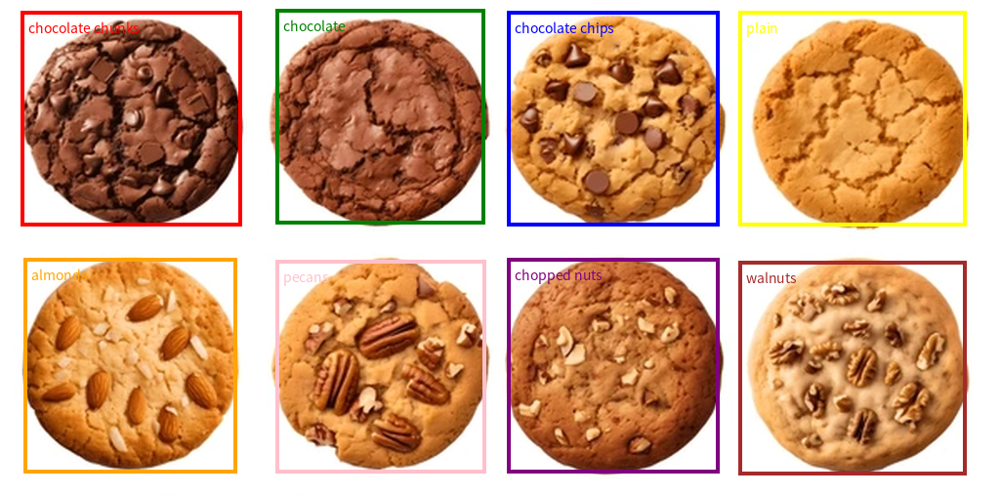

In [ ]:
plot_bounding_boxes(im, response.text)
im

**Use Case:** Find specific  Yoga position.
This use-case shows the ability of Gemini2.0 for searching specific image

```json
[
  {"box_2d": [312, 470, 484, 525], "label": "sitting yoga"},
  {"box_2d": [326, 146, 484, 285], "label": "sitting yoga"},
  {"box_2d": [727, 254, 884, 389], "label": "sitting yoga"},
  {"box_2d": [723, 521, 886, 610], "label": "sitting yoga"}
]
```
(1024, 1094)


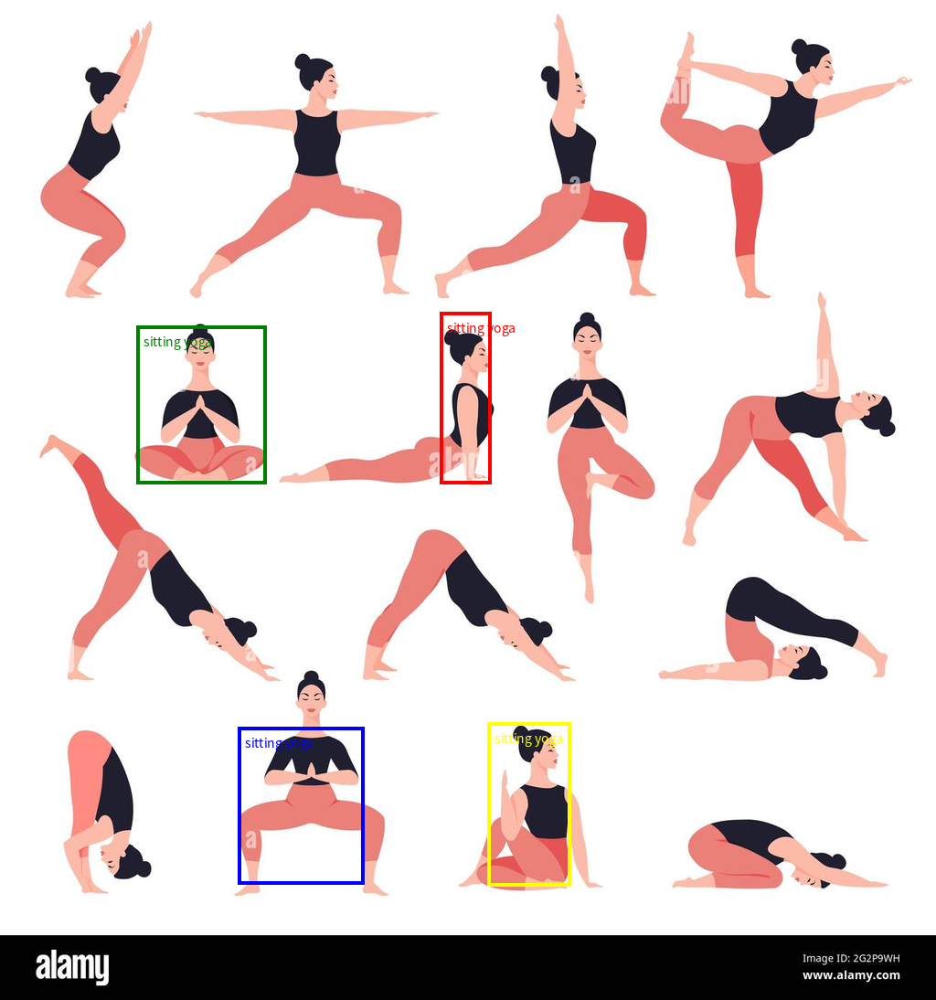

In [ ]:

image = "/content/yoga.jpg" # @param ["Socks.jpg","Vegetables.jpg","Japanese_bento.png","Cupcakes.jpg","Origamis.jpg","Fruits.jpg","Cat.jpg","Pumpkins.jpg","Breakfast.jpg","Bookshelf.jpg", "Spill.jpg"] {"allow-input":true}
prompt = "Show me the sitting  yogas only by creating bounding box"  # @param ["Detect all rainbow socks", "Find all socks and label them with emojis ", "Show me the positions of the socks with the face","Find the sock that goes with the one at the top"] {"allow-input":true}

# Load and resize image
img = Image.open(BytesIO(open(image, "rb").read()))
im = Image.open(image).resize((1024, int(1024 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS)

# Run model to find bounding boxes
response = client.models.generate_content(
    model=model_name,
    contents=[prompt, im],
    config = types.GenerateContentConfig(
        system_instruction=bounding_box_system_instructions,
        temperature=0.5,
        safety_settings=safety_settings,
    )
)

# Check output
print(response.text)

# Generate image with bounding boxes
plot_bounding_boxes(im, response.text)
im


**Use Case: Foreign Menu Understanding**
This use-case showcase the multilingual power of Gemini 2.0 for spatial understanding.

(1024, 1228)


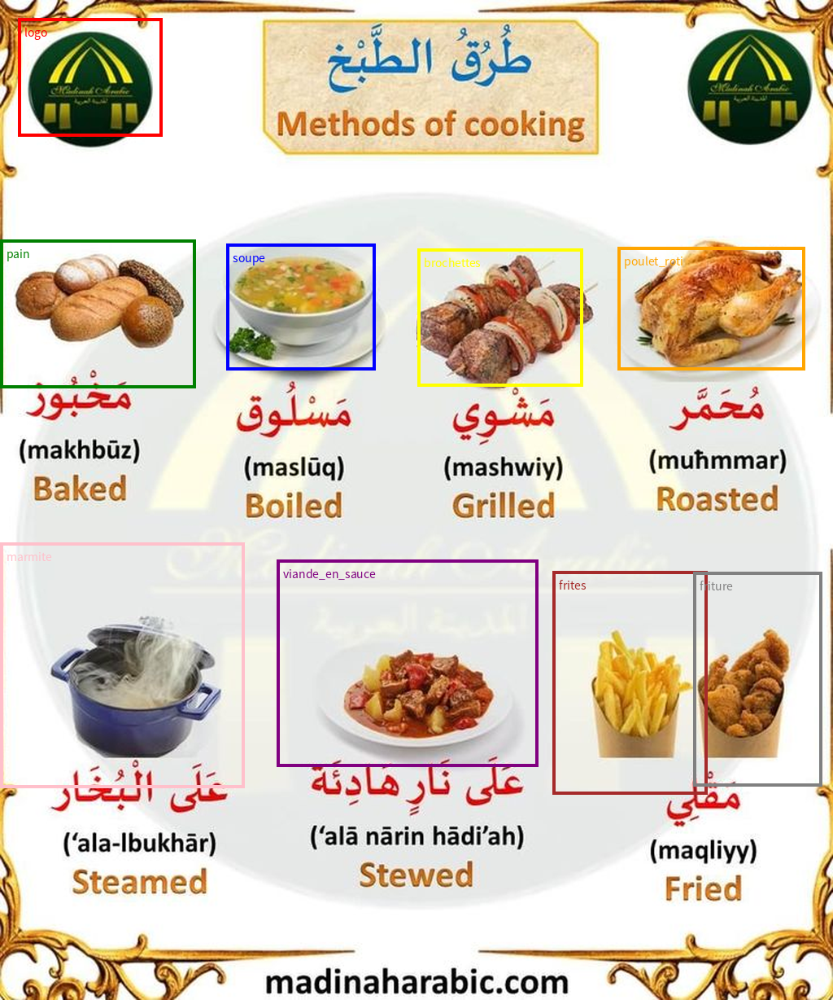

In [ ]:

image = "/content/foreign_menu.jpg" # @param ["Socks.jpg","Vegetables.jpg","Japanese_bento.png","Cupcakes.jpg","Origamis.jpg","Fruits.jpg","Cat.jpg","Pumpkins.jpg","Breakfast.jpg","Bookshelf.jpg", "Spill.jpg"] {"allow-input":true}
prompt = " give me the french names in the bounding box for each food"  # @param ["give me the french names in the bounding box for each food","Detect food items, with french translation in \"label\".", "Show me the vegan dishes","Find the dishes with allergens and label them accordingly"] {"allow-input":true}

# Load and resize image
img = Image.open(BytesIO(open(image, "rb").read()))
im = Image.open(image).resize((1024, int(1024 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS)

# Run model to find bounding boxes
response = client.models.generate_content(
    model=model_name,
    contents=[prompt, im],
    config = types.GenerateContentConfig(
        system_instruction=bounding_box_system_instructions,
        temperature=0.5,
        safety_settings=safety_settings,
    )
)

# Generate image with bounding boxes
plot_bounding_boxes(im, response.text)
im


**Use Case: Identify people's mood in a video conferencing call"**


This use case showcase reasoning capabilities of gemini 2.0


(1024, 593)


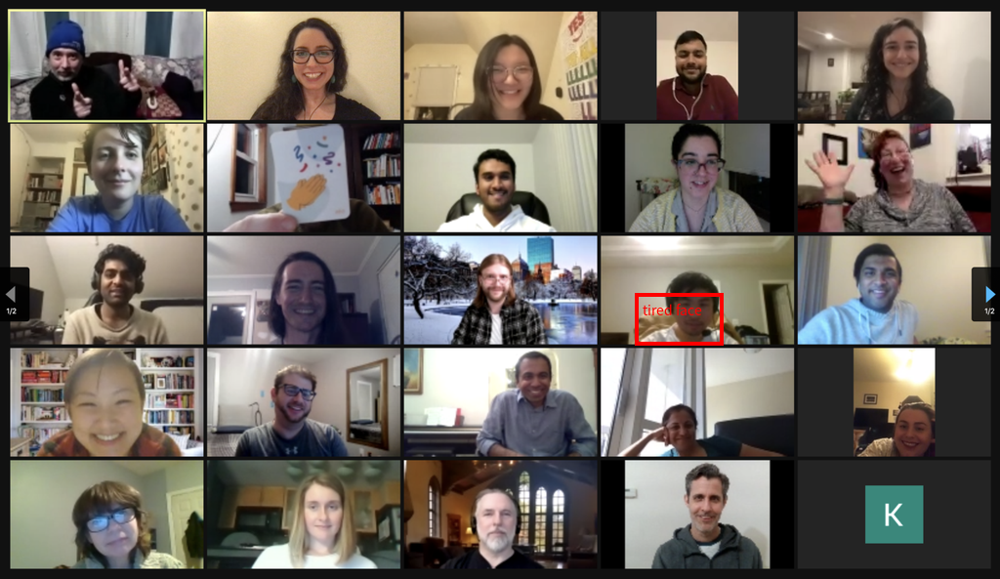

In [ ]:
image = "/content/zoom_face.png" # @param ["Socks.jpg","Vegetables.jpg","Japanese_bento.png","Cupcakes.jpg","Origamis.jpg","Fruits.jpg","Cat.jpg","Pumpkins.jpg","Breakfast.jpg","Bookshelf.jpg", "Spill.jpg"] {"allow-input":true}
prompt = "Find the tired face"  # @param ["Find the tired.","find is the smiling face"] {"allow-input":true}

# Load and resize image
img = Image.open(BytesIO(open(image, "rb").read()))
im = Image.open(image).resize((1024, int(1024 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS)

# Run model to find bounding boxes
response = client.models.generate_content(
    model=model_name,
    contents=[prompt, im],
    config = types.GenerateContentConfig(
        system_instruction=bounding_box_system_instructions,
        temperature=0.5,
        safety_settings=safety_settings,
    )
)

# Generate image with bounding boxes
plot_bounding_boxes(im, response.text)
im

(1024, 721)


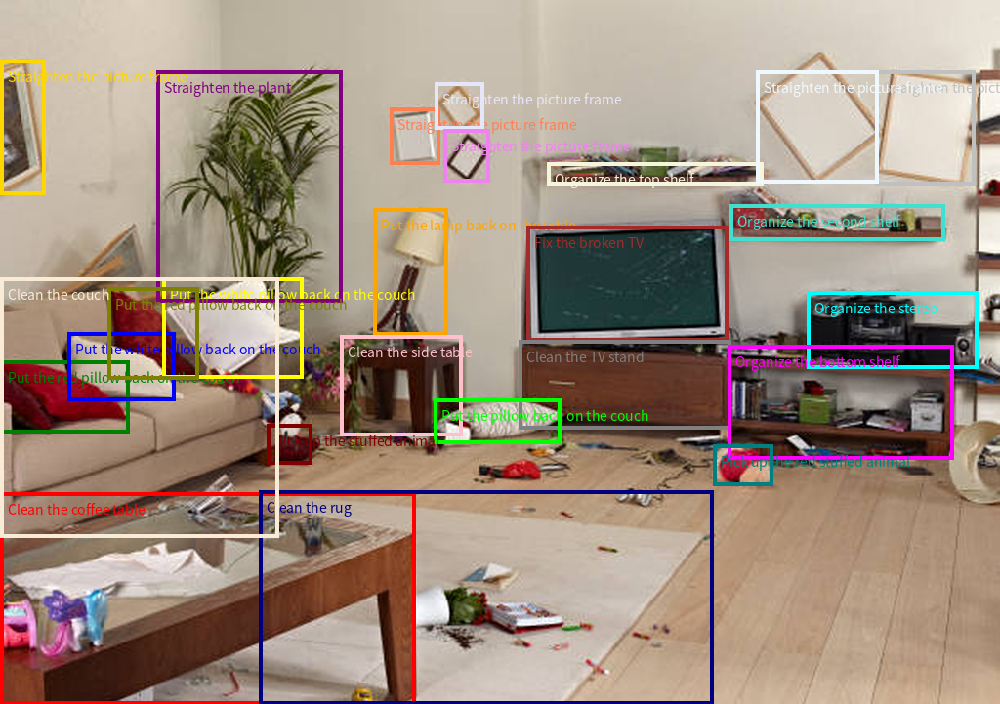

In [ ]:

image = "/content/messed_room.jpg" # @param ["Socks.jpg","Vegetables.jpg","Japanese_bento.png","Cupcakes.jpg","Origamis.jpg","Fruits.jpg","Cat.jpg","Pumpkins.jpg","Breakfast.jpg","Bookshelf.jpg", "Spill.jpg"] {"allow-input":true}
prompt = "Tell me how to clean my room with an explanation as label"  # @param ["Show me where my coffee was spilled.", "Tell me how to clean my table with an explanation as label","Draw a square around the fox' shadow"] {"allow-input":true}

# Load and resize image
img = Image.open(BytesIO(open(image, "rb").read()))
im = Image.open(image).resize((1024, int(1024 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS)

# Run model to find bounding boxes
response = client.models.generate_content(
    model=model_name,
    contents=[prompt, im],
    config = types.GenerateContentConfig(
        system_instruction=bounding_box_system_instructions,
        temperature=0.5,
        safety_settings=safety_settings,
    )
)

# Generate image with bounding boxes
plot_bounding_boxes(im, response.text)
im

**Use Case: Taking Suggestion from Gemini to Organize Room**

This usecase showcases Gemini 2.0's decision making as well as advising capabilities.

**3D bounding box**

The 3D bounding boz visualization is an ongoing feature. However, it can be helpful to understand location and position of the items as shown in the given examples.

In [ ]:
# Load the selected image
img = Image.open("/content/messed_room.jpg")

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents=[
        img,
        """
          Detect the 3D bounding boxes of no more than 10 items.
          Output a json list where each entry contains the object name in "label" and its 3D bounding box in "box_3d"
          The 3D bounding box format should be [x_center, y_center, z_center, x_size, y_size, z_size, roll, pitch, yaw].
        """
      ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Check response
print(image_response.text)


```json
[
  {"label": "couch", "box_3d": [1.71,3.26,0.17,0.44,0.4,1.42,-6,0,-22]},
  {"label": "television", "box_3d": [0.65,3.81,0.37,0.91,0.29,0.58,-6,2,0]},
  {"label": "table", "box_3d": [-0.61,1.56,-0.54,0.63,0.92,0.52,-6,0,-19]},
  {"label": "table", "box_3d": [0.92,3.77,-0.21,0.52,2.02,0.45,0,6,73]},
  {"label": "pillow", "box_3d": [-1.14,2.98,-0.08,0.39,0.59,0.41,-6,0,-19]},
    {"label": "pillow", "box_3d": [-1.39,2.79,-0.16,0.38,0.25,0.3,-6,0,-16]},
  {"label": "pillow", "box_3d": [-0.9,3.16,0.06,0.37,0.44,0.37,-6,0,-25]},
  {"label": "table", "box_3d": [-0.49,3.68,-0.19,0.59,0.28,0.42,-5,3,13]},
  {"label": "shelf", "box_3d": [1.05,3.86,0.77,0.22,1.82,0.32,0,6,75]},
    {"label": "shelf", "box_3d": [1.89,3.59,0.79,0.23,0.33,1.09,-6,0,-22]}
]
```


In [ ]:
!pip install plotly

In [ ]:
from IPython.display import HTML
import plotly.graph_objects as go
import json
from PIL import Image
import numpy as np

def generate_3d_box_html(pil_image, boxes_json):
    # Parse the JSON string into Python data
    boxes = json.loads(boxes_json)

    # Extract image dimensions
    img_width, img_height = pil_image.size

    # Convert the image to a numpy array for display
    img_array = np.array(pil_image)

    # Create 3D visualization
    fig = go.Figure()

    # Add 3D bounding boxes
    for box in boxes:
        label = box["label"]
        box_3d = box["box_3d"]

        # Extract box properties
        x, y, z, dx, dy, dz, yaw, pitch, roll = box_3d
        # Calculate corner points for the box (simplified for illustration)
        corners = [
            [x - dx/2, y - dy/2, z - dz/2],
            [x + dx/2, y - dy/2, z - dz/2],
            [x + dx/2, y + dy/2, z - dz/2],
            [x - dx/2, y + dy/2, z - dz/2],
            [x - dx/2, y - dy/2, z + dz/2],
            [x + dx/2, y - dy/2, z + dz/2],
            [x + dx/2, y + dy/2, z + dz/2],
            [x - dx/2, y + dy/2, z + dz/2]
        ]

        # Add the box as a mesh
        x_corners = [corner[0] for corner in corners]
        y_corners = [corner[1] for corner in corners]
        z_corners = [corner[2] for corner in corners]

        fig.add_trace(go.Mesh3d(
            x=x_corners,
            y=y_corners,
            z=z_corners,
            opacity=0.5,
            color="blue",
            name=label
        ))

    # Add image as a background (optional in 3D)
    fig.update_layout(
        scene=dict(
            xaxis=dict(title="X"),
            yaxis=dict(title="Y"),
            zaxis=dict(title="Z")
        )
    )

    # Return the HTML representation
    return fig.to_html()

# Example usage:
# Load an image (replace with your image)
img = Image.open("/content/messed_room.jpg")  # Replace with your image file path

# Replace with your JSON string (excluding "6:-3" slicing as it's unnecessary here)
boxes_json = """
[
  {"label": "couch", "box_3d": [1.71,3.26,0.17,0.44,0.4,1.42,-6,0,-22]},
  {"label": "television", "box_3d": [0.65,3.81,0.37,0.91,0.29,0.58,-6,2,0]},
  {"label": "table", "box_3d": [-0.61,1.56,-0.54,0.63,0.92,0.52,-6,0,-19]},
  {"label": "table", "box_3d": [0.92,3.77,-0.21,0.52,2.02,0.45,0,6,73]},
  {"label": "pillow", "box_3d": [-1.14,2.98,-0.08,0.39,0.59,0.41,-6,0,-19]},
    {"label": "pillow", "box_3d": [-1.39,2.79,-0.16,0.38,0.25,0.3,-6,0,-16]},
  {"label": "pillow", "box_3d": [-0.9,3.16,0.06,0.37,0.44,0.37,-6,0,-25]},
  {"label": "table", "box_3d": [-0.49,3.68,-0.19,0.59,0.28,0.42,-5,3,13]},
  {"label": "shelf", "box_3d": [1.05,3.86,0.77,0.22,1.82,0.32,0,6,75]},
    {"label": "shelf", "box_3d": [1.89,3.59,0.79,0.23,0.33,1.09,-6,0,-22]}
]
"""


# Generate the HTML visualization
html_output = generate_3d_box_html(img, boxes_json)

# Display in a Jupyter/Colab notebook
HTML(html_output)


In [ ]:
#@title 3D box visualization code

import IPython

def parse_json(json_output):
    # We parse out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output

def generate_3d_box_html(pil_image, boxes_json):
    # Convert PIL image to base64 string
    import base64
    from io import BytesIO
    buffered = BytesIO()
    pil_image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode()
    boxes_json = parse_json(boxes_json)

    return f"""



    3D Box Visualization









                    FOV:

                    60







                    Zoom:

                    1.5x








"""



In [ ]:
IPython.display.HTML(generate_3d_box_html(pil_image=img, boxes_json=image_response.text[6:-3]))

**Refrences**
1. To learn more about 3D visualization follow this [notebook](https://github.com/google-gemini/cookbook/blob/8662ad16cdded539fc6990f474e4a8cfd8b58323/gemini-2/spatial_understanding_3d.ipynb)

2. You can also check this notebook for see more examples of spatial [understanding](https://github.com/google-gemini/cookbook/blob/main/gemini-2/spatial_understanding.ipynb) of gemini.